## Exploratory Data Analysis of Airbnb Listings in Berlin

##### 1. Introduction of the Business Context

##### Client Overview
The client is a global short-term rental platform (e.g., Airbnb), aiming to better understand the Berlin property rental market through Exploratory Data Analysis (EDA). Their goal is to optimize pricing, improve customer satisfaction, and support hosts in decision-making.

##### Business Problem
Understanding pricing trends, host behaviors, and availability patterns in a major market like Berlin is critical. With increasing competition, Airbnb wants to offer smarter listing recommendations, guide hosts in pricing competitively, and improve guest satisfaction. EDA of listings can help reveal hidden patterns and provide data-backed strategies for operational improvement.

##### 2. Business Benefits
* For the Company:

    Optimize dynamic pricing based on neighborhood and room types.

    Identify high-performing areas and target them for promotion or expansion.

    Improve listing quality by analyzing underperforming listings.

    Detect commercial hosts who list multiple properties and tailor policies accordingly.

    Enhance search filters and platform UX through user behavior insights.

* For Customers:

    Price transparency across neighborhoods.

    Better recommendations based on data-driven trends.

    Improved trust & quality by filtering out low-availability listings.

    Personalized suggestions using popular room types and areas.

    Higher satisfaction by aligning listings with guest expectations.

 ##### 3. Data Collection
 The dataset is collected from https://insideairbnb.com/get-the-data/

 File used: listings.csv (Berlin) (Detailed version)

##### 4. Sample Data Overview
The dataset contains information about listings available for short-term rental in Berlin. 

It includes:

    Host Details: host ID, host listing count

    Property Info: room type, property type, neighborhood

    Location: latitude, longitude, neighborhood group

    Pricing & Availability: price, minimum nights, availability_365

    Review Info: number of reviews, last review date

##### 5. Formulating as an Analytical Task

In this project, the goal is to uncover patterns and insights from the Airbnb Berlin dataset to guide business decisions. 

The taks is framed as:

    Understand pricing variations by neighborhood and room type.

    Detect hosts with commercial behavior.

    Identify areas with high or low availability.

    Explore potential outliers and inconsistencies.

    Support strategic decisions for platform improvement.

#### 6. Importing the Required Libraries

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium #It is used to create interactive maps. Map listings using latitude/longitude
import warnings
warnings.filterwarnings("ignore") # This is used here to Suppresses warning messages that may clutter the notebook output.

##### 7. Fetching and Viewing Data

In [ ]:
df = pd.read_csv(r"C:\Users\spywa\Python_Project\Mini Projects\Project Data\listings.csv")

In [19]:
print(df.shape)

(14187, 18)


In [20]:

df.head() # Fetching and Viewing Data

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,3176,Fabulous Flat in great Location,3718,Britta,Pankow,Prenzlauer Berg Südwest,52.53471,13.41810,Entire home/apt,105.0,63,149,2025-03-02,0.76,1,250,1,NaN
1,9991,Geourgeous flat - outstanding views,33852,Philipp,Pankow,Prenzlauer Berg Südwest,52.53269,13.41805,Entire home/apt,135.0,6,7,2020-01-04,0.06,1,193,0,03/Z/RA/003410-18
2,14325,Studio Apartment in Prenzlauer Berg,55531,Chris + Oliver,Pankow,Prenzlauer Berg Nordwest,52.54813,13.40366,Entire home/apt,75.0,150,26,2023-11-30,0.14,4,262,0,NaN
3,16644,In the Heart of Berlin - Kreuzberg,64696,Rene,Friedrichshain-Kreuzberg,nördliche Luisenstadt,52.50312,13.43508,Entire home/apt,NaN,93,48,2017-12-14,0.26,2,0,0,NaN
4,17904,Beautiful Kreuzberg studio - 3 months minimum,68997,Matthias,Neukölln,Reuterstraße,52.49419,13.42166,Entire home/apt,28.0,92,298,2022-12-01,1.60,1,111,0,NaN


##### 8. Reviewing Dataset for Missing Values & Duplicates

In [21]:
df.isnull().sum() # Reviewing Dataset for Missing Values

id                                   0
name                                 0
host_id                              0
host_name                           13
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                             5004
minimum_nights                       0
number_of_reviews                    0
last_review                       3349
reviews_per_month                 3349
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
license                           8695
dtype: int64

In [22]:
df.duplicated().sum() # Reviewing Dataset for Duplicates

0

##### 9. Data Cleaning & Feature Selection in Dataset

##### 9.1 Removing Irrelevant or Redundant Columns

Some columns like name, description, neighbourhood_group_cleansed, and id are non-informative for analysis or they are duplicated in other columns. Hence, these columns can be removed.

In [23]:
df.drop(columns=['id', 'name', 'host_name', 'license', 'neighbourhood_group'], inplace=True)

##### 9.2  Converting price to Numeric


In [24]:
df['price'] = df['price'].replace('[\$,]', '', regex=True).astype(float)

##### 9.3 Handling Missing Values

In [25]:
# Filling the missing review values
df['reviews_per_month'].fillna(0, inplace=True)
df['last_review'].fillna('No reviews', inplace=True)

# Droping the rows with no price info
df = df[df['price'].notnull()]

##### 9.4 Removing the Duplicate values

In [26]:
df.drop_duplicates(inplace=True)

##### 9.5 Fixing Column Types - Some columns like 'last_review' should be in datetime format for time-based analysis.

In [27]:
df['last_review'] = pd.to_datetime(df['last_review'], errors='coerce')

##### 9.6 Feature Selection

Selecting only the relevant columns for your EDA.

Price, availability, Room type, neighbourhood, Latitude, longitude, Number of reviews, minimum nights

In [28]:
selected_columns = ['neighbourhood', 'room_type', 'price', 'minimum_nights',
                    'availability_365', 'number_of_reviews', 'reviews_per_month',
                    'calculated_host_listings_count', 'latitude', 'longitude']

df = df[selected_columns]

##### 10. Exploratory Data Analysis

##### 10.1 For Price Distribution 

histplot() is used for Price distribution. Using histplot, we got Skewness, common price ranges, outliers.

Text(0.5, 1.0, 'Price Distribution')

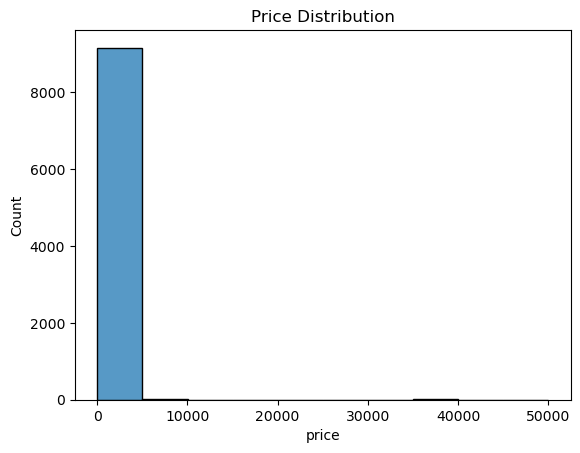

In [46]:
sns.histplot(df['price'], bins=10)
plt.title("Price Distribution")

Price Distribution is Highly Skewed. Most listings are priced under €150.
A small number of luxury listings are priced >€1000, which skews the mean.

Recommendation: Use median instead of mean for pricing insights and apply outlier filtering during future modeling.

##### 10.2 For Room Type Distribution

<Axes: xlabel='room_type', ylabel='count'>

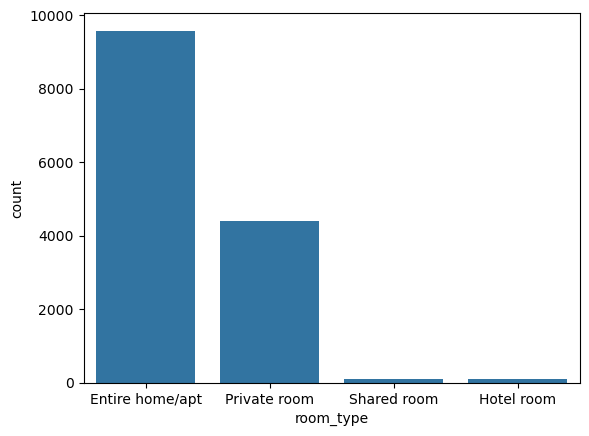

In [35]:
sns.countplot(data=df, x='room_type')

Room Type Affects Price Significantly. Entire home/apartment listings are the most common and most expensive.
Private rooms offer affordable alternatives and are more evenly distributed across neighborhoods.

Recommendation: Hosts can adjust room type offerings based on neighborhood pricing trends.

##### 10.3 For Listings by Neighborhood Group

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
 [Text(0, 0, 'Pankow'),
  Text(1, 0, 'Friedrichshain-Kreuzberg'),
  Text(2, 0, 'Neukölln'),
  Text(3, 0, 'Mitte'),
  Text(4, 0, 'Charlottenburg-Wilm.'),
  Text(5, 0, 'Tempelhof - Schöneberg'),
  Text(6, 0, 'Lichtenberg'),
  Text(7, 0, 'Treptow - Köpenick'),
  Text(8, 0, 'Steglitz - Zehlendorf'),
  Text(9, 0, 'Spandau'),
  Text(10, 0, 'Reinickendorf'),
  Text(11, 0, 'Marzahn - Hellersdorf')])

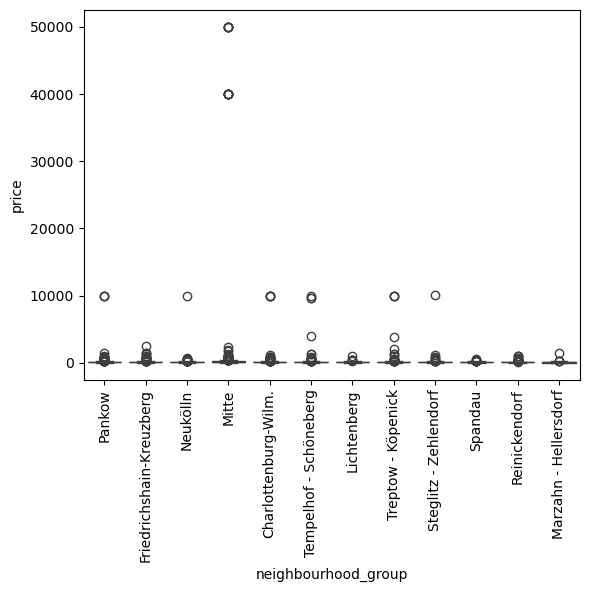

In [37]:
sns.boxplot(data=df, x='neighbourhood_group', y='price')
plt.xticks(rotation=90)

Central Neighborhoods Have Higher Prices
Boroughs like Mitte, Friedrichshain-Kreuzberg, and Charlottenburg-Wilmersdorf have significantly higher median prices.

Recommendation: These are prime zones for Airbnb's promotional campaigns or dynamic pricing optimization.

##### 10.4 Availability of Rooms

<Axes: xlabel='availability_365', ylabel='Count'>

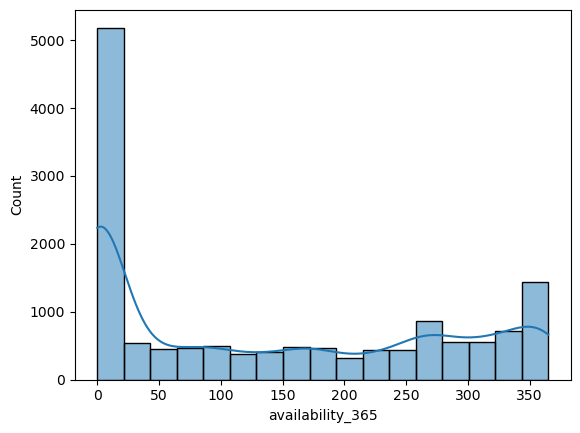

In [38]:
sns.histplot(df['availability_365'], kde=True)

Availability Varies Greatly
Some listings are available 365 days a year, others have 0 availability (possibly inactive).

Recommendation: Airbnb should clean inactive listings and prioritize high-availability ones in search results.

##### 10.5 Host Listing Count (For Commercial Purpose)

In [39]:
df['calculated_host_listings_count'].value_counts().head(10)

calculated_host_listings_count
1      8103
2      1498
3       651
5       465
4       400
323     323
6       276
7       252
8       240
9       189
Name: count, dtype: int64

High Number of Commercial Hosts. Many hosts list multiple properties, indicating commercial activity.

Recommendation: Airbnb may need to enforce or review local policies for multi-listing hosts to ensure fairness and compliance.

##### 11. Geospatial Mapping

In [40]:
map_berlin = folium.Map(location=[52.52, 13.405], zoom_start=11)
for idx, row in df.iterrows():
    folium.CircleMarker(location=[row["latitude"], row["longitude"]],
                        radius=1,
                        color="blue",
                        fill=True).add_to(map_berlin)
map_berlin

##### 12. Conclusion

Business Implications:

    Airbnb can improve pricing algorithms using location, room type, and availability data.

    Hosts can benchmark their properties for better competitiveness.

    Guests benefit from more transparent and relevant listings.

User Implications:

    Users gain better visibility into fair pricing by room type and location.

    Guests can choose budget-friendly or premium areas based on data.

    Prioritizing active and reviewed listings improves booking confidence.

    Data-driven filters enhance personalization and ease of use.
    
    Highlighting available, well-reviewed listings reduces booking issues.